In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test/pigmented benign keratosis/ISIC_0024371.jpg
/kaggle/input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test/pigmented benign keratosis/ISIC_0024358.jpg
/kaggle/input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test/pigmented benign keratosis/ISIC_0024337.jpg
/kaggle/input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test/pigmented benign keratosis/ISIC_0024382.jpg
/kaggle/input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test/pigmented benign keratosis/ISIC_0024420.jpg
/kaggle/input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test/pigmented benign keratosis/ISIC_0024409.jpg
/kaggle/input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration

In [2]:
import os
import re
import glob
import pathlib
import time
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import cv2

import PIL
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle  
from sklearn.metrics import confusion_matrix
from sklearn.utils import class_weight

from collections import Counter

from warnings import filterwarnings
filterwarnings('ignore')

SEED=123
np.random.seed(SEED)

In [3]:
df_eda = pd.DataFrame()

classes = []
train_image_number_breakdown = {}
test_image_number_breakdown = {}
number_test_images = 0
number_train_images = 0
for class_name in os.listdir("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train"):
    classes.append(class_name)
    path = os.path.join("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train",class_name)
    count = len([entry for entry in os.listdir(path) if os.path.isfile(os.path.join(path, entry))]) 
    train_image_number_breakdown[class_name] = count
    number_train_images += count


for class_name in os.listdir("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test"):
    classes.append(class_name)
    path = os.path.join("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test",class_name)
    count = len([entry for entry in os.listdir(path) if os.path.isfile(os.path.join(path, entry))]) 
    test_image_number_breakdown[class_name] = count
    number_test_images += count

classes = list(set(classes))

In [4]:
print("Number of Train Images {}".format(number_train_images))
print("Number of Test Images {}".format(number_test_images))
print("##"*25)
print("Train Images Breakdown {}".format(train_image_number_breakdown))
print("__"*25)
print("Test Images Breakdown {}".format(test_image_number_breakdown))
print("##"*25)
print("Classes {}".format(classes))

Number of Train Images 2239
Number of Test Images 118
##################################################
Train Images Breakdown {'pigmented benign keratosis': 462, 'melanoma': 438, 'vascular lesion': 139, 'actinic keratosis': 114, 'squamous cell carcinoma': 181, 'basal cell carcinoma': 376, 'seborrheic keratosis': 77, 'dermatofibroma': 95, 'nevus': 357}
__________________________________________________
Test Images Breakdown {'pigmented benign keratosis': 16, 'melanoma': 16, 'vascular lesion': 3, 'actinic keratosis': 16, 'squamous cell carcinoma': 16, 'basal cell carcinoma': 16, 'seborrheic keratosis': 3, 'dermatofibroma': 16, 'nevus': 16}
##################################################
Classes ['actinic keratosis', 'seborrheic keratosis', 'nevus', 'melanoma', 'basal cell carcinoma', 'squamous cell carcinoma', 'vascular lesion', 'dermatofibroma', 'pigmented benign keratosis']


In [5]:
skin_df = pd.DataFrame()
classes = []
images = []
for class_name in os.listdir("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test"):
    path = os.path.join("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Test",class_name)
    for image in os.listdir(path):
        classes.append(class_name)
        images.append(os.path.join(path,image))
skin_df["cell_type"] = classes
skin_df["image"] = images

In [6]:
skin_df.head(100)

,cell_type,image
0,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
1,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
2,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
3,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
4,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
...,...,...
95,dermatofibroma,../input/skin-cancer9-classesisic/Skin cancer ...
96,dermatofibroma,../input/skin-cancer9-classesisic/Skin cancer ...
97,dermatofibroma,../input/skin-cancer9-classesisic/Skin cancer ...
98,dermatofibroma,../input/skin-cancer9-classesisic/Skin cancer ...


In [7]:
skin_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118 entries, 0 to 117
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   cell_type  118 non-null    object
 1   image      118 non-null    object
dtypes: object(2)
memory usage: 2.0+ KB


In [8]:
skin_df.describe()

,cell_type,image
count,118,118
unique,9,118
top,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
freq,16,1


In [9]:
skin_df.dropna()

,cell_type,image
0,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
1,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
2,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
3,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
4,pigmented benign keratosis,../input/skin-cancer9-classesisic/Skin cancer ...
...,...,...
113,nevus,../input/skin-cancer9-classesisic/Skin cancer ...
114,nevus,../input/skin-cancer9-classesisic/Skin cancer ...
115,nevus,../input/skin-cancer9-classesisic/Skin cancer ...
116,nevus,../input/skin-cancer9-classesisic/Skin cancer ...


In [10]:
skin_df.to_csv

<bound method NDFrame.to_csv of                       cell_type  \
0    pigmented benign keratosis   
1    pigmented benign keratosis   
2    pigmented benign keratosis   
3    pigmented benign keratosis   
4    pigmented benign keratosis   
..                          ...   
113                       nevus   
114                       nevus   
115                       nevus   
116                       nevus   
117                       nevus   

                                                 image  
0    ../input/skin-cancer9-classesisic/Skin cancer ...  
1    ../input/skin-cancer9-classesisic/Skin cancer ...  
2    ../input/skin-cancer9-classesisic/Skin cancer ...  
3    ../input/skin-cancer9-classesisic/Skin cancer ...  
4    ../input/skin-cancer9-classesisic/Skin cancer ...  
..                                                 ...  
113  ../input/skin-cancer9-classesisic/Skin cancer ...  
114  ../input/skin-cancer9-classesisic/Skin cancer ...  
115  ../input/skin-cancer9-classes

In [11]:
skin_df.nunique()

cell_type      9
image        118
dtype: int64

In [12]:
skin_df.columns

Index(['cell_type', 'image'], dtype='object')

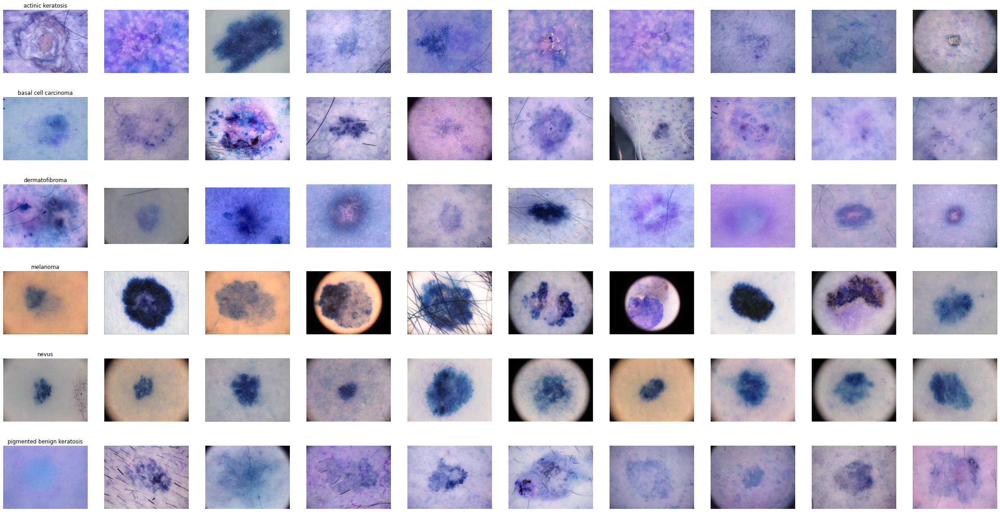

In [13]:
%matplotlib inline
from matplotlib import pyplot as plt
import cv2
n_samples = 10
fig, m_axs = plt.subplots(6, n_samples, figsize = (4*n_samples, 3*7))
for n_axs, (type_name, type_rows) in zip(m_axs, 
                                         skin_df.sort_values(['cell_type']).groupby('cell_type')):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=1234).iterrows()):
        image = cv2.imread(c_row['image'])
        #image = cv2.cvtColor(c_row['image'], cv2.COLOR_BGR2RGB)
        c_ax.imshow(image)
        c_ax.axis('off')
fig.savefig('category_samples.png', dpi=300)

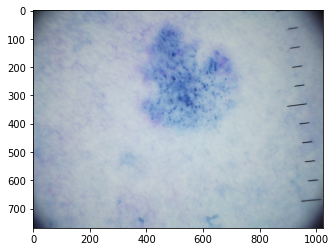

In [14]:
image1 = cv2.imread("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train/melanoma/ISIC_0009927.jpg")
plt.imshow(image1)

In [15]:
image1

array([[[27, 32, 41],
        [31, 36, 45],
        [31, 36, 45],
        ...,
        [13, 15, 16],
        [13, 15, 16],
        [13, 15, 16]],

       [[28, 33, 42],
        [31, 36, 45],
        [32, 37, 46],
        ...,
        [14, 16, 17],
        [14, 16, 17],
        [13, 15, 16]],

       [[30, 35, 44],
        [33, 38, 47],
        [33, 38, 47],
        ...,
        [15, 17, 18],
        [14, 16, 17],
        [14, 16, 17]],

       ...,

       [[22, 27, 42],
        [25, 30, 45],
        [28, 33, 48],
        ...,
        [17, 19, 27],
        [17, 19, 27],
        [16, 18, 26]],

       [[21, 26, 41],
        [23, 28, 43],
        [25, 30, 45],
        ...,
        [16, 18, 26],
        [15, 17, 25],
        [15, 17, 25]],

       [[23, 28, 43],
        [23, 28, 43],
        [23, 28, 43],
        ...,
        [14, 16, 24],
        [13, 15, 23],
        [13, 15, 23]]], dtype=uint8)

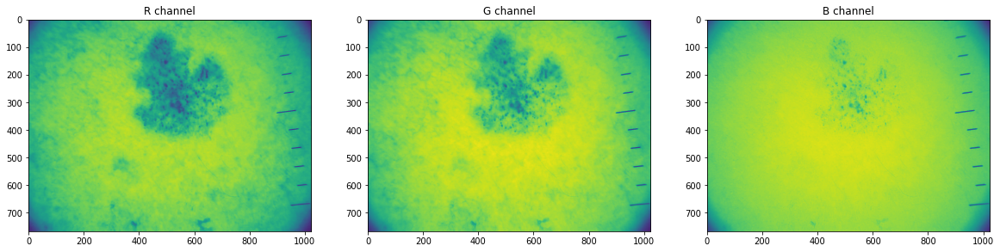

In [16]:
r = image1[:,:,0]
g = image1[:,:,1]
b = image1[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)

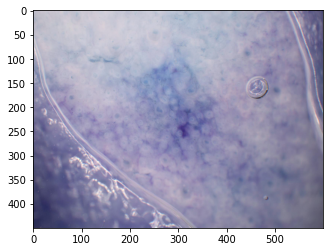

In [17]:
image2 = cv2.imread("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train/nevus/ISIC_0026848.jpg")
plt.imshow(image2)

In [18]:
image2

array([[[186, 188, 199],
        [188, 188, 202],
        [190, 184, 201],
        ...,
        [ 67,  65, 111],
        [ 57,  60, 105],
        [ 52,  57, 106]],

       [[189, 189, 201],
        [189, 189, 203],
        [193, 189, 201],
        ...,
        [ 72,  69, 114],
        [ 60,  58, 104],
        [ 54,  58, 106]],

       [[191, 191, 203],
        [191, 191, 203],
        [194, 193, 203],
        ...,
        [ 78,  73, 118],
        [ 67,  65, 111],
        [ 60,  60, 108]],

       ...,

       [[ 46,  46,  86],
        [ 43,  45,  85],
        [ 45,  45,  85],
        ...,
        [ 86,  84, 104],
        [ 86,  84, 104],
        [ 85,  83, 103]],

       [[ 44,  44,  84],
        [ 45,  45,  85],
        [ 43,  45,  85],
        ...,
        [ 87,  85, 105],
        [ 87,  85, 105],
        [ 88,  86, 106]],

       [[ 45,  44,  83],
        [ 44,  47,  85],
        [ 41,  47,  84],
        ...,
        [ 87,  85, 105],
        [ 87,  85, 105],
        [ 88,  86, 106]]

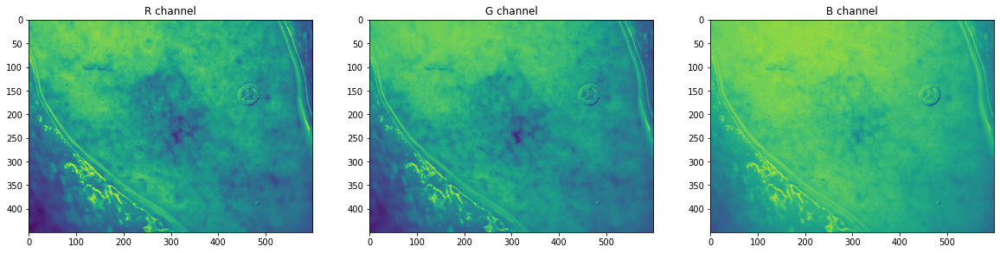

In [19]:
r = image2[:,:,0]
g = image2[:,:,1]
b = image2[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)

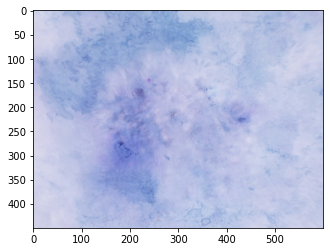

In [20]:
image3=cv2.imread("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train/basal cell carcinoma/ISIC_0028568.jpg")
plt.imshow(image3)

In [21]:
image3

array([[[206, 209, 230],
        [207, 210, 231],
        [206, 209, 230],
        ...,
        [191, 195, 224],
        [192, 194, 224],
        [191, 195, 223]],

       [[206, 209, 230],
        [207, 210, 231],
        [206, 210, 229],
        ...,
        [191, 193, 223],
        [191, 195, 224],
        [193, 197, 225]],

       [[207, 210, 231],
        [207, 210, 231],
        [207, 210, 231],
        ...,
        [191, 195, 223],
        [192, 194, 224],
        [192, 196, 224]],

       ...,

       [[204, 207, 228],
        [205, 208, 229],
        [207, 210, 231],
        ...,
        [199, 201, 231],
        [202, 205, 233],
        [201, 203, 234]],

       [[204, 205, 226],
        [204, 207, 228],
        [204, 209, 230],
        ...,
        [198, 202, 231],
        [199, 203, 232],
        [200, 204, 233]],

       [[205, 206, 227],
        [204, 207, 228],
        [204, 209, 230],
        ...,
        [199, 202, 230],
        [198, 201, 229],
        [198, 201, 229]]

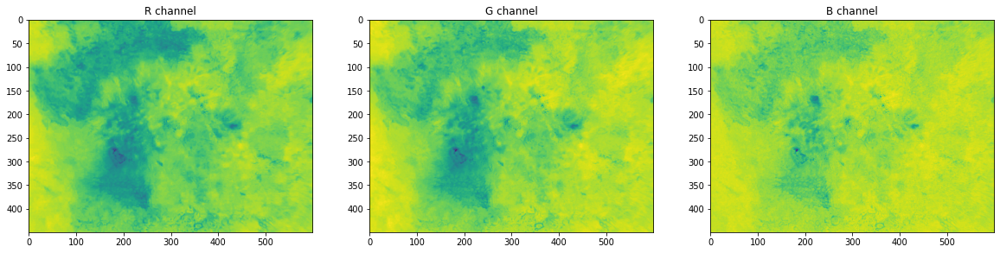

In [22]:
r = image3[:,:,0]
g = image3[:,:,1]
b = image3[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)

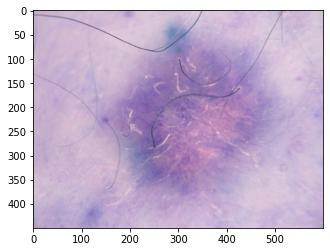

In [23]:
image4=cv2.imread("../input/skin-cancer9-classesisic/skin cancer isic the international skin imaging collaboration/Skin cancer ISIC The International Skin Imaging Collaboration/Train/dermatofibroma/ISIC_0031827.jpg")
plt.imshow(image4)

In [24]:
image4

array([[[193, 172, 204],
        [192, 171, 203],
        [189, 172, 205],
        ...,
        [201, 187, 211],
        [200, 188, 208],
        [200, 188, 208]],

       [[195, 172, 204],
        [192, 171, 203],
        [192, 171, 203],
        ...,
        [203, 190, 212],
        [203, 190, 212],
        [203, 190, 212]],

       [[196, 172, 204],
        [194, 171, 203],
        [194, 171, 203],
        ...,
        [204, 192, 212],
        [204, 192, 214],
        [204, 192, 214]],

       ...,

       [[168, 156, 192],
        [170, 158, 194],
        [173, 159, 195],
        ...,
        [181, 161, 196],
        [178, 161, 195],
        [177, 158, 197]],

       [[167, 154, 192],
        [168, 156, 192],
        [174, 159, 191],
        ...,
        [183, 161, 196],
        [180, 160, 195],
        [178, 160, 197]],

       [[164, 153, 191],
        [165, 154, 192],
        [171, 157, 191],
        ...,
        [180, 160, 195],
        [177, 159, 196],
        [177, 159, 196]]

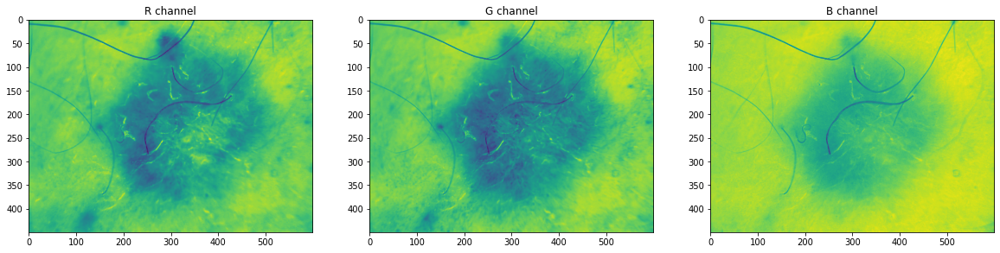

In [25]:
r = image4[:,:,0]
g = image4[:,:,1]
b = image4[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)

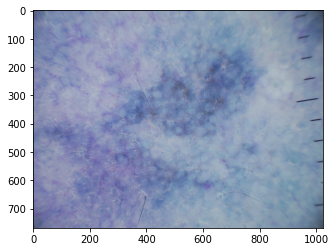

In [26]:
image5=cv2.imread("../input/skin-cancer9-classesisic/skin cancer isic the international skin imaging collaboration/Skin cancer ISIC The International Skin Imaging Collaboration/Train/seborrheic keratosis/ISIC_0011077.jpg")
plt.imshow(image5)

In [27]:
image5

array([[[ 82,  88, 123],
        [ 84,  90, 125],
        [ 84,  90, 125],
        ...,
        [ 58,  66,  89],
        [ 56,  63,  83],
        [ 52,  59,  79]],

       [[ 83,  89, 124],
        [ 84,  90, 125],
        [ 83,  89, 124],
        ...,
        [ 58,  66,  89],
        [ 56,  65,  85],
        [ 54,  63,  83]],

       [[ 85,  90, 123],
        [ 86,  91, 124],
        [ 83,  90, 123],
        ...,
        [ 55,  66,  88],
        [ 56,  67,  87],
        [ 56,  67,  87]],

       ...,

       [[ 80,  86, 123],
        [ 79,  85, 122],
        [ 77,  85, 122],
        ...,
        [ 68,  82, 104],
        [ 63,  80, 101],
        [ 63,  80, 101]],

       [[ 77,  83, 120],
        [ 74,  80, 117],
        [ 72,  80, 117],
        ...,
        [ 64,  78, 100],
        [ 62,  76,  98],
        [ 61,  75,  97]],

       [[ 76,  82, 119],
        [ 73,  79, 116],
        [ 71,  79, 116],
        ...,
        [ 61,  75,  97],
        [ 62,  76,  98],
        [ 60,  74,  96]]

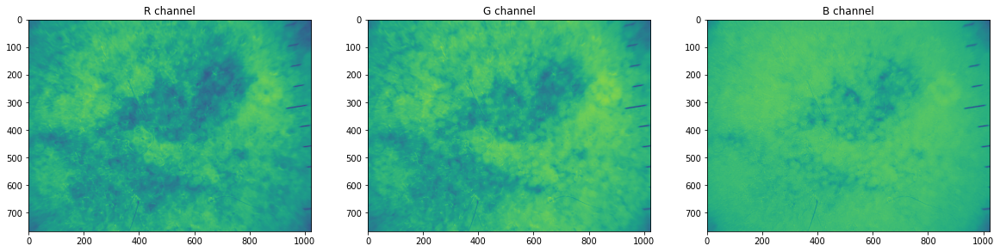

In [28]:
r = image5[:,:,0]
g = image5[:,:,1]
b = image5[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)

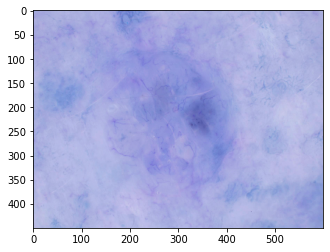

In [29]:
image6=cv2.imread("../input/skin-cancer9-classesisic/skin cancer isic the international skin imaging collaboration/Skin cancer ISIC The International Skin Imaging Collaboration/Train/basal cell carcinoma/ISIC_0029602.jpg")
plt.imshow(image6)

In [30]:
image6

array([[[167, 171, 220],
        [163, 170, 220],
        [161, 168, 218],
        ...,
        [173, 177, 225],
        [173, 177, 225],
        [171, 175, 223]],

       [[167, 171, 220],
        [166, 171, 220],
        [163, 170, 219],
        ...,
        [172, 176, 224],
        [173, 178, 223],
        [171, 175, 224]],

       [[164, 166, 220],
        [164, 168, 219],
        [162, 167, 216],
        ...,
        [172, 177, 222],
        [173, 178, 223],
        [171, 175, 224]],

       ...,

       [[178, 187, 224],
        [178, 187, 225],
        [179, 187, 224],
        ...,
        [140, 159, 216],
        [137, 157, 214],
        [139, 158, 215]],

       [[178, 187, 224],
        [178, 187, 224],
        [179, 187, 224],
        ...,
        [137, 156, 213],
        [138, 157, 214],
        [137, 156, 213]],

       [[178, 187, 224],
        [178, 187, 224],
        [179, 187, 224],
        ...,
        [136, 155, 212],
        [136, 155, 212],
        [133, 152, 209]]

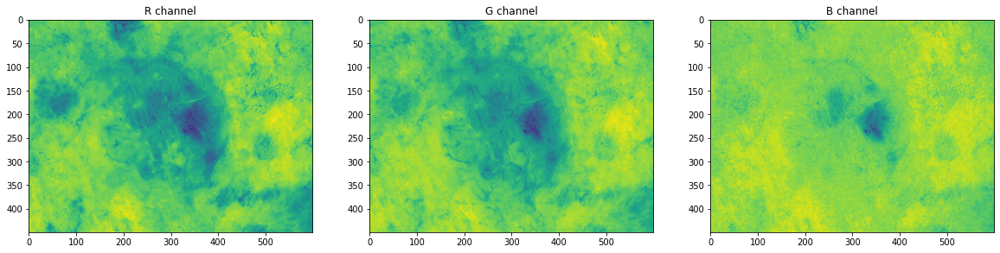

In [31]:
r = image6[:,:,0]
g = image6[:,:,1]
b = image6[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)

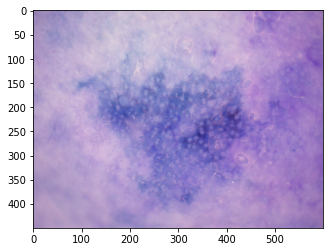

In [32]:
image7=cv2.imread("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train/actinic keratosis/ISIC_0033358.jpg")
plt.imshow(image7)

In [33]:
image7

array([[[155, 130, 180],
        [155, 134, 179],
        [157, 137, 180],
        ...,
        [148, 111, 173],
        [144, 109, 173],
        [141, 106, 173]],

       [[153, 133, 180],
        [154, 133, 178],
        [154, 133, 178],
        ...,
        [144, 109, 176],
        [145, 108, 176],
        [144, 105, 173]],

       [[152, 130, 182],
        [153, 132, 181],
        [156, 132, 180],
        ...,
        [146, 112, 176],
        [143, 112, 173],
        [143, 109, 174]],

       ...,

       [[164, 136, 189],
        [161, 136, 186],
        [160, 134, 187],
        ...,
        [145, 115, 174],
        [147, 115, 174],
        [149, 113, 173]],

       [[162, 137, 187],
        [163, 135, 188],
        [161, 135, 183],
        ...,
        [148, 116, 175],
        [147, 113, 173],
        [151, 116, 173]],

       [[163, 136, 186],
        [167, 138, 187],
        [165, 140, 184],
        ...,
        [149, 117, 172],
        [147, 113, 173],
        [148, 117, 172]]

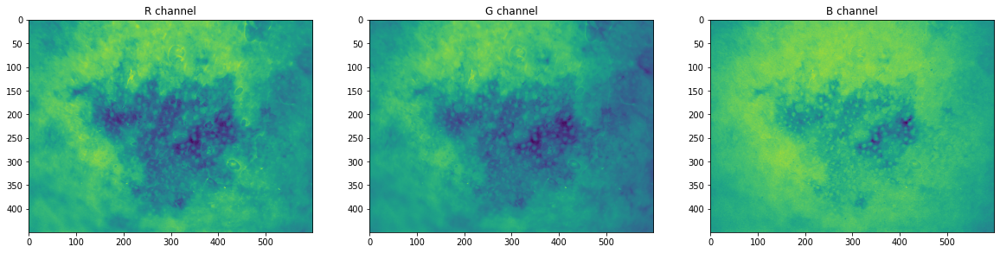

In [34]:
r = image7[:,:,0]
g = image7[:,:,1]
b = image7[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)

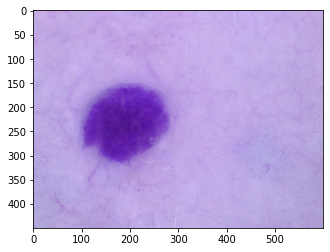

In [35]:
image8=cv2.imread("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train/vascular lesion/ISIC_0025680.jpg")
plt.imshow(image8)

In [36]:
image8

array([[[191, 164, 228],
        [190, 163, 226],
        [191, 164, 228],
        ...,
        [192, 167, 225],
        [188, 170, 223],
        [193, 173, 226]],

       [[191, 166, 226],
        [192, 166, 226],
        [193, 167, 227],
        ...,
        [194, 170, 228],
        [195, 172, 227],
        [198, 170, 229]],

       [[194, 166, 225],
        [192, 167, 225],
        [191, 166, 222],
        ...,
        [193, 171, 229],
        [194, 172, 224],
        [194, 170, 224]],

       ...,

       [[173, 160, 214],
        [175, 159, 213],
        [178, 160, 213],
        ...,
        [172, 153, 208],
        [170, 152, 205],
        [172, 153, 204]],

       [[179, 160, 217],
        [173, 157, 211],
        [175, 159, 213],
        ...,
        [173, 157, 210],
        [166, 153, 205],
        [165, 153, 203]],

       [[174, 155, 212],
        [171, 155, 209],
        [174, 155, 212],
        ...,
        [169, 156, 208],
        [167, 153, 207],
        [168, 152, 206]]

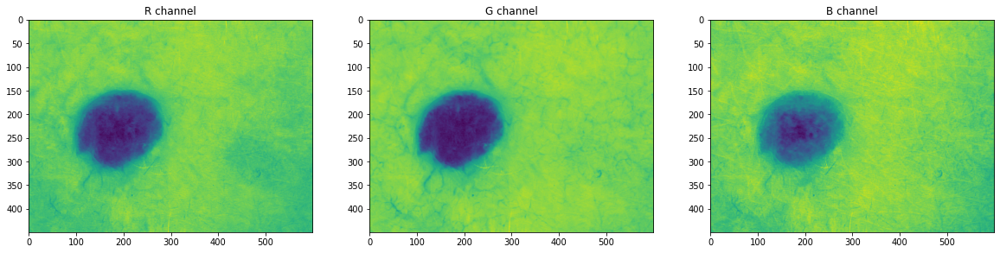

In [37]:
r = image8[:,:,0]
g = image8[:,:,1]
b = image8[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)

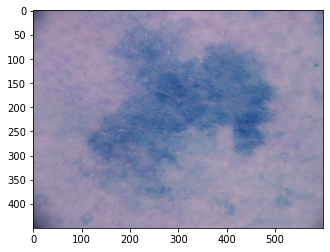

In [38]:
image9=cv2.imread("../input/skin-cancer9-classesisic/Skin cancer ISIC The International Skin Imaging Collaboration/Train/pigmented benign keratosis/ISIC_0028258.jpg")
plt.imshow(image9)

In [39]:
image9

array([[[ 75,  70, 102],
        [ 78,  73, 105],
        [ 77,  75, 105],
        ...,
        [125, 118, 151],
        [124, 117, 150],
        [123, 117, 148]],

       [[ 76,  71, 103],
        [ 77,  75, 105],
        [ 78,  76, 106],
        ...,
        [129, 116, 154],
        [128, 119, 152],
        [124, 117, 150]],

       [[ 78,  71, 104],
        [ 79,  76, 108],
        [ 81,  79, 109],
        ...,
        [129, 114, 152],
        [127, 114, 152],
        [124, 117, 152]],

       ...,

       [[ 52,  56,  84],
        [ 54,  58,  86],
        [ 58,  60,  90],
        ...,
        [114, 113, 139],
        [115, 112, 137],
        [113, 109, 138]],

       [[ 52,  56,  85],
        [ 56,  58,  88],
        [ 57,  59,  90],
        ...,
        [115, 111, 140],
        [115, 112, 138],
        [113, 110, 132]],

       [[ 50,  49,  81],
        [ 52,  52,  82],
        [ 53,  55,  86],
        ...,
        [115, 112, 137],
        [114, 111, 136],
        [115, 111, 136]]

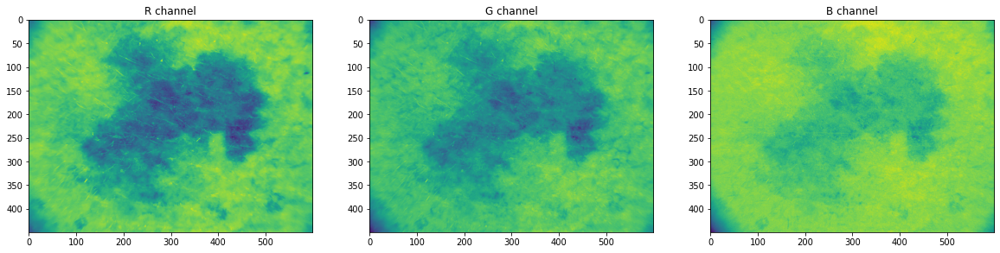

In [40]:
r = image9[:,:,0]
g = image9[:,:,1]
b = image9[:,:,2]

# Visualize the individual color channels
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.set_title('R channel')
ax1.imshow(r)
ax2.set_title('G channel')
ax2.imshow(g)
ax3.set_title('B channel')
ax3.imshow(b)